<a href="https://colab.research.google.com/github/RaghavM11/Nerf_EECS503/blob/main/NeRF_hotdog_lessimages_2000epochs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NeRF-- Walk Through ⛷️

**[Project Page](https://nerfmm.active.vision/) | [Code](https://github.com/ActiveVisionLab/nerfmm) | [Arxiv](https://arxiv.org/abs/2102.07064) | [CoLab Example Data](https://www.robots.ox.ac.uk/~ryan/nerfmm2021/nerfmm_colab_data.tar.gz)**

📖 In this notebook, we will walk you through how we optimise **camera poses**, **intrinsics**, and a **NeRF** at same time, given forward-facing images as the only input, without COLMAP or any SfM/SLAM systems involved. This is a simplified version of our [any_folder target](https://github.com/ActiveVisionLab/nerfmm/tree/main/tasks/any_folder).

🏔 ***You can try your own data in this colab environment as well (Step 1a)✨.***  

🤔 If you have any questions, please raise an issue in our [github repo](https://github.com/ActiveVisionLab/nerfmm).

## Step 0: Set up environment


Clone our repo to use low level functions

In [1]:
!git clone https://github.com/ActiveVisionLab/nerfmm.git

Cloning into 'nerfmm'...
remote: Enumerating objects: 100, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 100 (delta 2), reused 0 (delta 0), pack-reused 94
Receiving objects: 100% (100/100), 82.80 MiB | 41.87 MiB/s, done.
Resolving deltas: 100% (19/19), done.


Get prepared example data

In [2]:
# get prepared example scenes
!wget https://www.robots.ox.ac.uk/~ryan/nerfmm2021/nerfmm_colab_data.tar.gz

# extract and clean storage
!tar xzf nerfmm_colab_data.tar.gz
!rm nerfmm_colab_data.tar.gz

--2023-12-08 04:24:35--  https://www.robots.ox.ac.uk/~ryan/nerfmm2021/nerfmm_colab_data.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25803698 (25M) [application/x-gzip]
Saving to: ‘nerfmm_colab_data.tar.gz’

nerfmm_colab_data.t 100%[===================>]  24.61M  14.7MB/s    in 1.7s    

2023-12-08 04:24:37 (14.7 MB/s) - ‘nerfmm_colab_data.tar.gz’ saved [25803698/25803698]



Import packages and functions

In [3]:
import os, random, datetime
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import imageio
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import Image
from google.colab import files

Set random seeds for the entire session.

In [4]:
random.seed(17)
np.random.seed(17)
torch.manual_seed(17)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Import general NeRF-related functions, including:

- positional encoding
- volume sampling
- volume rendering
- ray direction computing

These functions are useful to general NeRF training, but are not of interest in this notebook so we omit these details. More details can be found in our [git repo](https://https://github.com/ActiveVisionLab/nerfmm).


In [5]:
from nerfmm.utils.pos_enc import encode_position
from nerfmm.utils.volume_op import volume_rendering, volume_sampling_ndc
from nerfmm.utils.comp_ray_dir import comp_ray_dir_cam_fxfy

# utlities
from nerfmm.utils.training_utils import mse2psnr
from nerfmm.utils.lie_group_helper import convert3x4_4x4

## Step 1a: Select scenes

### Opt A: try our prepared images
We provide 3 prepared scenes, including
- two scenes from [NeRF-LLFF dataset](https://drive.google.com/drive/folders/128yBriW1IG_3NJ5Rp7APSTZsJqdJdfc1) but in lower resolution: *llff_leaves* and *llff_flower*;
- a scene captured by us: *desk*.

Set the `scene_name` to (`'llff_leaves'`/`'llff_flower'`/`'desk'`) to use our prepared data.

### Opt B: try your images
You can also try your images by setting the `scene_name` to `'upload'` and an upload button will appear to allow you upload your images. The full procedures are as follows:
1. Take about 20-60 **foward-facing** images in [LLFF fashion](https://github.com/Fyusion/LLFF/blob/master/imgs/capture.gif).
2. Resize them to smaller resolusion so that `max(H, W) < 1000`. On linux, you can use command `mogrify` to resize all images in a folder:
```bash
mogrify -resize 25% ./images/*
```
You might need to adjust the `25%` according to your original image size. Overall we just want to ease the burden on colab.
3. Zip the image folder and upload the `.zip` file. Make sure the image folder you compressed contains images only, and the images are stored in common image types such as jpg or png. For example, if you have images in a folder `images`:
```
images/
    |--0000.png
    |--0001.png
    |--0002.png
  ...
```
you can just run `zip -r images.zip ./images` and upload the `images.zip` using the upload entry below.

In [6]:
scene_name = input('Pick a scene: (llff_flower / llff_leaves / desk / upload) ')
print('Selected scene: ', scene_name)
if scene_name in ['llff_flower', 'llff_leaves', 'desk']:
    image_dir = os.path.join('nerfmm_colab_data', scene_name)
elif scene_name == 'upload':
    try:
        !rm -rf 'custom_upload'

        uploaded = files.upload()
        up_file_name = list(uploaded.keys())[0]
        print('Uploaded file "{name}" with size ~{length} MB'.format(name=up_file_name, length=len(uploaded[up_file_name])/1e6))

        !mv $up_file_name 'custom_upload.zip'
        !unzip 'custom_upload.zip' -d 'custom_upload'
        !rm 'custom_upload.zip'
        image_dir = os.path.join('custom_upload', os.listdir('custom_upload')[0])
        print('Upload and unzip done.')
    except:
        print('Seems like upload failed. Please retry.')
else:
    scene_name = 'llff_flower'
    image_dir = os.path.join('nerfmm_colab_data', scene_name)
    print('Unknown scene name. Using llff_flower scene.')


Pick a scene: (llff_flower / llff_leaves / desk / upload) upload
Selected scene:  upload


Saving testfew.zip to testfew.zip
Uploaded file "testfew.zip" with size ~9.357814 MB
Archive:  custom_upload.zip
   creating: custom_upload/test/
  inflating: custom_upload/test/r_23.png  
  inflating: custom_upload/test/r_37.png  
  inflating: custom_upload/test/r_21.png  
  inflating: custom_upload/test/r_34.png  
  inflating: custom_upload/test/r_20.png  
  inflating: custom_upload/test/r_53.png  
  inflating: custom_upload/test/r_35.png  
  inflating: custom_upload/test/r_46.png  
  inflating: custom_upload/test/r_52.png  
  inflating: custom_upload/test/r_47.png  
  inflating: custom_upload/test/r_8.png  
  inflating: custom_upload/test/r_51.png  
  inflating: custom_upload/test/r_50.png  
  inflating: custom_upload/test/r_44.png  
  inflating: custom_upload/test/r_45.png  
  inflating: custom_upload/test/r_40.png  
  inflating: custom_upload/test/r_55.png  
  inflating: custom_upload/test/r_57.png  
  inflating: custom_upload/test/r_42.png  
  inflating: custom_upload/test/r_9.pn

## Step 1b: Load images

<ipython-input-7-2e55a974cf6d>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8


Loaded 24 imgs, resolution 800 x 800
torch.Size([24, 800, 800, 3])


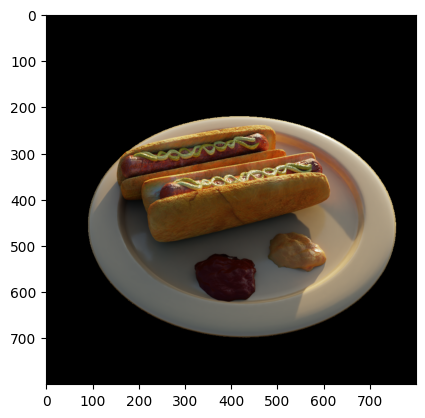

In [7]:
def load_imgs(image_dir):
    img_names = np.array(sorted(os.listdir(image_dir)))  # all image names
    img_paths = [os.path.join(image_dir, n) for n in img_names]
    N_imgs = len(img_paths)

    img_list = []
    for p in img_paths:
        img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8
        img_list.append(img)
    img_list = np.stack(img_list)  # (N, H, W, 3)
    img_list = torch.from_numpy(img_list).float() / 255  # (N, H, W, 3) torch.float32
    H, W = img_list.shape[1], img_list.shape[2]

    results = {
        'imgs': img_list,  # (N, H, W, 3) torch.float32
        'img_names': img_names,  # (N, )
        'N_imgs': N_imgs,
        'H': H,
        'W': W,
    }
    return results

image_data = load_imgs(image_dir)
imgs = image_data['imgs']  # (N, H, W, 3) torch.float32

N_IMGS = image_data['N_imgs']
H = image_data['H']
W = image_data['W']

print('Loaded {0} imgs, resolution {1} x {2}'.format(N_IMGS, H, W))
print(imgs.shape)
plt.imshow(imgs[0])

## Step 2a: Define learnable FOCALS

We initialise $f_x = W$ and $f_y = H$.

In practice, two coeffcients are initialised at $1.0$ and multiplied with the input image size. We also found a $2^{nd}$-order trick provides slightly better results, but it's not necessary. For more details about the $2^{nd}$-order trick, see the supplementary section in our [arxiv paper](https://https://arxiv.org/abs/2102.07064).

In [8]:
class LearnFocal(nn.Module):
    def __init__(self, H, W, req_grad):
        super(LearnFocal, self).__init__()
        self.H = H
        self.W = W
        self.fx = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )
        self.fy = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )

    def forward(self):
        # order = 2, check our supplementary.
        fxfy = torch.stack([self.fx**2 * self.W, self.fy**2 * self.H])
        return fxfy

## Step 2b: Define learnable POSES

Given $N$ input images, we learn a camera pose for each of them. Camera rotations are optimised in axis-angle representation and translations are optimised in Euclidean space.

In [9]:
def vec2skew(v):
    """
    :param v:  (3, ) torch tensor
    :return:   (3, 3)
    """
    zero = torch.zeros(1, dtype=torch.float32, device=v.device)
    skew_v0 = torch.cat([ zero,    -v[2:3],   v[1:2]])  # (3, 1)
    skew_v1 = torch.cat([ v[2:3],   zero,    -v[0:1]])
    skew_v2 = torch.cat([-v[1:2],   v[0:1],   zero])
    skew_v = torch.stack([skew_v0, skew_v1, skew_v2], dim=0)  # (3, 3)
    return skew_v  # (3, 3)


def Exp(r):
    """so(3) vector to SO(3) matrix
    :param r: (3, ) axis-angle, torch tensor
    :return:  (3, 3)
    """
    skew_r = vec2skew(r)  # (3, 3)
    norm_r = r.norm() + 1e-15
    eye = torch.eye(3, dtype=torch.float32, device=r.device)
    R = eye + (torch.sin(norm_r) / norm_r) * skew_r + ((1 - torch.cos(norm_r)) / norm_r**2) * (skew_r @ skew_r)
    return R


def make_c2w(r, t):
    """
    :param r:  (3, ) axis-angle             torch tensor
    :param t:  (3, ) translation vector     torch tensor
    :return:   (4, 4)
    """
    R = Exp(r)  # (3, 3)
    c2w = torch.cat([R, t.unsqueeze(1)], dim=1)  # (3, 4)
    c2w = convert3x4_4x4(c2w)  # (4, 4)
    return c2w


class LearnPose(nn.Module):
    def __init__(self, num_cams, learn_R, learn_t):
        super(LearnPose, self).__init__()
        self.num_cams = num_cams
        self.r = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_R)  # (N, 3)
        self.t = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_t)  # (N, 3)

    def forward(self, cam_id):
        r = self.r[cam_id]  # (3, ) axis-angle
        t = self.t[cam_id]  # (3, )
        c2w = make_c2w(r, t)  # (4, 4)
        return c2w

## Step 2c: Define a tiny NeRF
We define a tiny NeRF for faster colab training, with following modifications:
- We use 4 linear layers (official NeRF has 8) before the RGB and density fully connect layers.
- We discard the shortcut since the tiny NeRF is quite shallow now.

In [10]:
class TinyNerf(nn.Module):
    def __init__(self, pos_in_dims, dir_in_dims, D):
        """
        :param pos_in_dims: scalar, number of channels of encoded positions
        :param dir_in_dims: scalar, number of channels of encoded directions
        :param D:           scalar, number of hidden dimensions
        """
        super(TinyNerf, self).__init__()

        self.pos_in_dims = pos_in_dims
        self.dir_in_dims = dir_in_dims

        self.layers0 = nn.Sequential(
            nn.Linear(pos_in_dims, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
        )

        self.fc_density = nn.Linear(D, 1)
        self.fc_feature = nn.Linear(D, D)
        self.rgb_layers = nn.Sequential(nn.Linear(D + dir_in_dims, D//2), nn.ReLU())
        self.fc_rgb = nn.Linear(D//2, 3)

        self.fc_density.bias.data = torch.tensor([0.1]).float()
        self.fc_rgb.bias.data = torch.tensor([0.02, 0.02, 0.02]).float()

    def forward(self, pos_enc, dir_enc):
        """
        :param pos_enc: (H, W, N_sample, pos_in_dims) encoded positions
        :param dir_enc: (H, W, N_sample, dir_in_dims) encoded directions
        :return: rgb_density (H, W, N_sample, 4)
        """
        x = self.layers0(pos_enc)  # (H, W, N_sample, D)
        density = self.fc_density(x)  # (H, W, N_sample, 1)

        feat = self.fc_feature(x)  # (H, W, N_sample, D)
        x = torch.cat([feat, dir_enc], dim=3)  # (H, W, N_sample, D+dir_in_dims)
        x = self.rgb_layers(x)  # (H, W, N_sample, D/2)
        rgb = self.fc_rgb(x)  # (H, W, N_sample, 3)

        rgb_den = torch.cat([rgb, density], dim=3)  # (H, W, N_sample, 4)
        return rgb_den

## Step 3: Training pipeline

### Set ray parameters

In [11]:
class RayParameters():
    def __init__(self):
      self.NEAR, self.FAR = 0.0, 1.0  # ndc near far
      self.N_SAMPLE = 128  # samples per ray
      self.POS_ENC_FREQ = 10  # positional encoding freq for location
      self.DIR_ENC_FREQ = 4   # positional encoding freq for direction

ray_params = RayParameters()

### Define training function
During training, two key steps enable back-propagation:
1. Compute ray directions using estimated intrinsics online.
2. Sample the 3D volume using estimated poses and intrinsics online.

We highlight those two parts in their related comments with "KEY" keyword.

In [12]:
def model_render_image(c2w, rays_cam, t_vals, ray_params, H, W, fxfy, nerf_model,
                       perturb_t, sigma_noise_std):
    """
    :param c2w:         (4, 4)                  pose to transform ray direction from cam to world.
    :param rays_cam:    (someH, someW, 3)       ray directions in camera coordinate, can be random selected
                                                rows and cols, or some full rows, or an entire image.
    :param t_vals:      (N_samples)             sample depth along a ray.
    :param perturb_t:   True/False              perturb t values.
    :param sigma_noise_std: float               add noise to raw density predictions (sigma).
    :return:            (someH, someW, 3)       volume rendered images for the input rays.
    """
    # KEY 2: sample the 3D volume using estimated poses and intrinsics online.
    # (H, W, N_sample, 3), (H, W, 3), (H, W, N_sam)
    sample_pos, _, ray_dir_world, t_vals_noisy = volume_sampling_ndc(c2w, rays_cam, t_vals, ray_params.NEAR,
                                                                     ray_params.FAR, H, W, fxfy, perturb_t)

    # encode position: (H, W, N_sample, (2L+1)*C = 63)
    pos_enc = encode_position(sample_pos, levels=ray_params.POS_ENC_FREQ, inc_input=True)

    # encode direction: (H, W, N_sample, (2L+1)*C = 27)
    ray_dir_world = F.normalize(ray_dir_world, p=2, dim=2)  # (H, W, 3)
    dir_enc = encode_position(ray_dir_world, levels=ray_params.DIR_ENC_FREQ, inc_input=True)  # (H, W, 27)
    dir_enc = dir_enc.unsqueeze(2).expand(-1, -1, ray_params.N_SAMPLE, -1)  # (H, W, N_sample, 27)

    # inference rgb and density using position and direction encoding.
    rgb_density = nerf_model(pos_enc, dir_enc)  # (H, W, N_sample, 4)

    render_result = volume_rendering(rgb_density, t_vals_noisy, sigma_noise_std, rgb_act_fn=torch.sigmoid)
    rgb_rendered = render_result['rgb']  # (H, W, 3)
    depth_map = render_result['depth_map']  # (H, W)

    result = {
        'rgb': rgb_rendered,  # (H, W, 3)
        'depth_map': depth_map,  # (H, W)
    }

    return result


def train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                    opt_pose, nerf_model, focal_net, pose_param_net):
    nerf_model.train()
    focal_net.train()
    pose_param_net.train()

    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position
    L2_loss_epoch = []

    # shuffle the training imgs
    ids = np.arange(N_IMGS)
    np.random.shuffle(ids)

    for i in ids:
        fxfy = focal_net()

        # KEY 1: compute ray directions using estimated intrinsics online.
        ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
        img = imgs[i].to('cuda')  # (H, W, 4)
        c2w = pose_param_net(i)  # (4, 4)

        # sample 32x32 pixel on an image and their rays for training.
        r_id = torch.randperm(H, device='cuda')[:32]  # (N_select_rows)
        c_id = torch.randperm(W, device='cuda')[:32]  # (N_select_cols)
        ray_selected_cam = ray_dir_cam[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)
        img_selected = img[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)

        # render an image using selected rays, pose, sample intervals, and the network
        render_result = model_render_image(c2w, ray_selected_cam, t_vals, ray_params,
                                           H, W, fxfy, nerf_model, perturb_t=True, sigma_noise_std=0.0)
        rgb_rendered = render_result['rgb']  # (N_select_rows, N_select_cols, 3)
        L2_loss = F.mse_loss(rgb_rendered, img_selected)  # loss for one image

        L2_loss.backward()
        opt_nerf.step()
        opt_focal.step()
        opt_pose.step()
        opt_nerf.zero_grad()
        opt_focal.zero_grad()
        opt_pose.zero_grad()

        L2_loss_epoch.append(L2_loss)

    L2_loss_epoch_mean = torch.stack(L2_loss_epoch).mean().item()
    return L2_loss_epoch_mean

### Define evaluation function

We render an image from a $4\times4$ identity matrix as we do not have train/eval pose at all.

Render results can be found in the tensorboard above.

In [13]:
def render_novel_view(c2w, H, W, fxfy, ray_params, nerf_model):
    nerf_model.eval()

    ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position

    c2w = c2w.to('cuda')  # (4, 4)

    # split an image to rows when the input image resolution is high
    rays_dir_cam_split_rows = ray_dir_cam.split(10, dim=0)  # input 10 rows each time
    rendered_img = []
    rendered_depth = []
    for rays_dir_rows in rays_dir_cam_split_rows:
        render_result = model_render_image(c2w, rays_dir_rows, t_vals, ray_params,
                                           H, W, fxfy, nerf_model,
                                           perturb_t=False, sigma_noise_std=0.0)
        rgb_rendered_rows = render_result['rgb']  # (num_rows_eval_img, W, 3)
        depth_map = render_result['depth_map']  # (num_rows_eval_img, W)

        rendered_img.append(rgb_rendered_rows)
        rendered_depth.append(depth_map)

    # combine rows to an image
    rendered_img = torch.cat(rendered_img, dim=0)  # (H, W, 3)
    rendered_depth = torch.cat(rendered_depth, dim=0)  # (H, W)
    return rendered_img, rendered_depth

## Tensorborad 📈

In [14]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Step 4: Actual training ⚽
- In our paper, we train our our NeRF-- for 10K epochs. but due to the limited GPU resources available in colab, we train our NeRF-- system for 200 epochs (< 10 min) for now, from which a blurry nerf and a rough estimation of camera parameters can be acquired.
- Depending on scenes, the depth estimation should start making sense at some point. All examples in this notebook should have a correct depth estimation before 200 epochs. However, we cannot guarentee similar performance for uploaded images.
- ***Despite the renderings after 200 epochs are blurry, which can be improved progressively during training, a near-far relationship should be established in 200 epochs for our prepared data in this notebook experiment***. A darker area in a depth map denotes closer distance than a brighter area.
- During training, we check if the joint optimisation is successful by writing the depth estimation to tensorboard every 50 epochs. The depth map is estimated from a camera pose that is set to identity matrix. Check the *Image* tab in the tensorboard above.


In [15]:
N_EPOCH = 2000  # set to 1000 to get slightly better results. we use 10K epoch in our paper.
EVAL_INTERVAL = 50  # render an image to visualise for every this interval.

# Initialise all trainabled parameters
focal_net = LearnFocal(H, W, req_grad=True).cuda()
pose_param_net = LearnPose(num_cams=N_IMGS, learn_R=True, learn_t=True).cuda()

# Get a tiny NeRF model. Hidden dimension set to 128
nerf_model = TinyNerf(pos_in_dims=63, dir_in_dims=27, D=128).cuda()

# Set lr and scheduler: these are just stair-case exponantial decay lr schedulers.
opt_nerf = torch.optim.Adam(nerf_model.parameters(), lr=0.001)
opt_focal = torch.optim.Adam(focal_net.parameters(), lr=0.001)
opt_pose = torch.optim.Adam(pose_param_net.parameters(), lr=0.001)

from torch.optim.lr_scheduler import MultiStepLR
scheduler_nerf = MultiStepLR(opt_nerf, milestones=list(range(0, 10000, 10)), gamma=0.9954)
scheduler_focal = MultiStepLR(opt_focal, milestones=list(range(0, 10000, 100)), gamma=0.9)
scheduler_pose = MultiStepLR(opt_pose, milestones=list(range(0, 10000, 100)), gamma=0.9)

# Set tensorboard writer
writer = SummaryWriter(log_dir=os.path.join('logs', scene_name, str(datetime.datetime.now().strftime('%y%m%d_%H%M%S'))))

# Store poses to visualise them later
pose_history = []

# Training
print('Training... Check results in the tensorboard above.')
for epoch_i in tqdm(range(N_EPOCH), desc='Training'):
    L2_loss = train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                              opt_pose, nerf_model, focal_net, pose_param_net)
    train_psnr = mse2psnr(L2_loss)

    writer.add_scalar('train/psnr', train_psnr, epoch_i)

    fxfy = focal_net()
    print('epoch {0:4d} Training PSNR {1:.3f}, estimated fx {2:.1f} fy {3:.1f}'.format(epoch_i, train_psnr, fxfy[0], fxfy[1]))

    scheduler_nerf.step()
    scheduler_focal.step()
    scheduler_pose.step()

    learned_c2ws = torch.stack([pose_param_net(i) for i in range(N_IMGS)])  # (N, 4, 4)
    pose_history.append(learned_c2ws[:, :3, 3])  # (N, 3) only store positions as we vis in 2D.

    with torch.no_grad():
        if (epoch_i+1) % EVAL_INTERVAL == 0:
            eval_c2w = torch.eye(4, dtype=torch.float32)  # (4, 4)
            fxfy = focal_net()
            rendered_img, rendered_depth = render_novel_view(eval_c2w, H, W, fxfy, ray_params, nerf_model)
            writer.add_image('eval/img', rendered_img.permute(2, 0, 1), global_step=epoch_i)
            writer.add_image('eval/depth', rendered_depth.unsqueeze(0), global_step=epoch_i)

pose_history = torch.stack(pose_history).detach().cpu().numpy()  # (N_epoch, N_img, 3)
print('Training finished.')

Training... Check results in the tensorboard above.


Training:   0%|          | 0/2000 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


epoch    0 Training PSNR 10.018, estimated fx 799.8 fy 802.0
epoch    1 Training PSNR 12.969, estimated fx 799.0 fy 804.3
epoch    2 Training PSNR 15.312, estimated fx 797.1 fy 796.0
epoch    3 Training PSNR 16.064, estimated fx 779.2 fy 782.1
epoch    4 Training PSNR 16.499, estimated fx 759.6 fy 766.0
epoch    5 Training PSNR 16.909, estimated fx 761.6 fy 757.2
epoch    6 Training PSNR 16.973, estimated fx 764.9 fy 761.5
epoch    7 Training PSNR 16.696, estimated fx 757.7 fy 757.6
epoch    8 Training PSNR 17.221, estimated fx 750.8 fy 754.1
epoch    9 Training PSNR 17.358, estimated fx 745.9 fy 745.8
epoch   10 Training PSNR 17.564, estimated fx 742.6 fy 751.0
epoch   11 Training PSNR 17.348, estimated fx 728.6 fy 747.9
epoch   12 Training PSNR 17.087, estimated fx 732.5 fy 749.9
epoch   13 Training PSNR 18.191, estimated fx 734.2 fy 734.4
epoch   14 Training PSNR 17.973, estimated fx 731.3 fy 728.1
epoch   15 Training PSNR 18.021, estimated fx 733.4 fy 711.5
epoch   16 Training PSNR

## Step 5: Novel View Synthesis 🖼️

In [16]:
# Render novel views from a sprial camera trajectory.
# The spiral trajectory generation function is modified from https://github.com/kwea123/nerf_pl.
from nerfmm.utils.pose_utils import create_spiral_poses

# Render full images are time consuming, especially on colab so we render a smaller version instead.
resize_ratio = 4
with torch.no_grad():
    optimised_poses = torch.stack([pose_param_net(i) for i in range(N_IMGS)])
    radii = np.percentile(np.abs(optimised_poses.cpu().numpy()[:, :3, 3]), q=50, axis=0)  # (3,)
    spiral_c2ws = create_spiral_poses(radii, focus_depth=3.5, n_poses=30, n_circle=1)
    spiral_c2ws = torch.from_numpy(spiral_c2ws).float()  # (N, 3, 4)

    # change intrinsics according to resize ratio
    fxfy = focal_net()
    novel_fxfy = fxfy / resize_ratio
    novel_H, novel_W = H // resize_ratio, W // resize_ratio

    print('NeRF trained in {0:d} x {1:d} for {2:d} epochs'.format(H, W, N_EPOCH))
    print('Rendering novel views in {0:d} x {1:d}'.format(novel_H, novel_W))

    novel_img_list, novel_depth_list = [], []
    for i in tqdm(range(spiral_c2ws.shape[0]), desc='novel view rendering'):
        novel_img, novel_depth = render_novel_view(spiral_c2ws[i], novel_H, novel_W, novel_fxfy,
                                                   ray_params, nerf_model)
        novel_img_list.append(novel_img)
        novel_depth_list.append(novel_depth)

    print('Novel view rendering done. Saving to GIF images...')
    novel_img_list = (torch.stack(novel_img_list) * 255).cpu().numpy().astype(np.uint8)
    novel_depth_list = (torch.stack(novel_depth_list) * 200).cpu().numpy().astype(np.uint8)  # depth is always in 0 to 1 in NDC

    os.makedirs('nvs_results', exist_ok=True)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + '_img.gif'), novel_img_list, fps=30)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + '_depth.gif'), novel_depth_list, fps=30)
    print('GIF images saved.')

NeRF trained in 800 x 800 for 2000 epochs
Rendering novel views in 200 x 200


novel view rendering:   0%|          | 0/30 [00:00<?, ?it/s]

Novel view rendering done. Saving to GIF images...
GIF images saved.


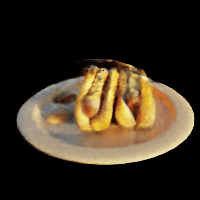

In [25]:
Image(open(os.path.join('nvs_results', scene_name + '_img.gif'), 'rb').read())

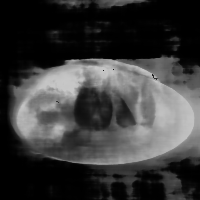

In [18]:
Image(open(os.path.join('nvs_results', scene_name + '_depth.gif'), 'rb').read())

## Step 6: Visualise Camera Poses 📷

We visualise the optimisation process of camera poses from Z direction, i.e. on 2D XY-plane.

In [19]:
%matplotlib inline
from matplotlib import animation
from IPython.display import HTML

fig = plt.figure(figsize=(6, 6))
ax0 = plt.subplot(111)
ax0.set_xlim((-0.5, 0.5))
ax0.set_ylim((-0.5, 0.5))
ax0.set_xlabel('X')
ax0.set_ylabel('Y')
ax0.grid(ls='--', color='0.7')

title = ax0.set_title('')
traj_line, = ax0.plot([], [], c='blue', ls='-', marker='^', linewidth=0.7, markersize=4)

def drawframe(fr_id):
    """
    :param fr_id: frame id
    :param poses: (N_img, 3) camera positions
    """
    poses = pose_history[fr_id]
    traj_line.set_data(poses[:, 0], poses[:, 1])
    title.set_text('epoch {0:4d}'.format(fr_id))
    return (traj_line,)

anim = animation.FuncAnimation(fig, drawframe, frames=N_EPOCH, interval=100)

plt.close(anim._fig)
HTML(anim.to_html5_video())